# **Тематическое моделирование сообщений с форума Reddit с помощью библиотеки BERTopic**

Этот проект позволяет:

1. Получить данные из Reddit
2. Очистить полученные данные
3. Извлечь главные обсуждаемые темы из обсуждений
4. Сохранить результат в формате csv

Проект можно подстраивать под другие источники информации, что позволяет проводить разные эксперименты.

## Загрузка данных из Reddit:

Извлекаемые данные - комментарии пользователей, поэтому в подробном обзоре не нуждаются.

### Импорт библиотек:

In [1]:
import praw
from datetime import datetime
import configparser
import time
from tqdm import tqdm

### Инициализация Reddit API:

In [2]:
config = configparser.ConfigParser()
config.read("config.ini")

['config.ini']

In [3]:
reddit = praw.Reddit(
    client_id=config.get("reddit", "client_id"),
    client_secret=config.get("reddit", "client_secret"),
    user_agent=config.get("reddit", "user_agent"),
    check_for_async=False,
)

Version 7.8.0 of praw is outdated. Version 7.8.1 was released 2 days ago.


### Выбор ветки форума:

In [4]:
subreddit = reddit.subreddit("politics")

### Загрузка комментариев из самых обсуждаемых тем за день:

In [5]:
comms = []

# Получаем список самых обсуждаемых тем за день
hot_submissions = subreddit.top(time_filter="day", limit=75)

# Проходим по всем обсуждаемым темам
for submission in tqdm(hot_submissions):
    # Проверяем, что тема была создана за последние 24 часа
    if submission.created_utc > time.time() - 24 * 60 * 60:
        submission.comments.replace_more(
            limit=0
        )  # Загружаем только те комментарии, которые алгоритмы Reddit считают самыми важными
        for comment in submission.comments.list():
            comms.append(comment.body)

75it [01:27,  1.16s/it]


### Вывод первых результатов:

Видно, что в данных присутствуют html элементы, специальные символы и прочий шум. Поэтому, нужно провести очистку данных. 

In [6]:
comms[:20]

["\nAs a reminder, this subreddit [is for civil discussion.](/r/politics/wiki/index#wiki_be_civil)\n\nIn general, be courteous to others. Debate/discuss/argue the merits of ideas, don't attack people. Personal insults, shill or troll accusations, hate speech, any suggestion or support of harm, violence, or death, and other rule violations can result in a permanent ban. \n\nIf you see comments in violation of our rules, please report them.\n\n For those who have questions regarding any media outlets being posted on this subreddit, please click [here](https://www.reddit.com/r/politics/wiki/approveddomainslist) to review our details as to our approved domains list and outlet criteria.\n \n We are actively looking for new moderators.  If you have any interest in helping to make this subreddit a place for quality discussion, please fill out [this form](https://docs.google.com/forms/d/1y2swHD0KXFhStGFjW6k54r9iuMjzcFqDIVwuvdLBjSA).\n \n\n***\n\n\n*I am a bot, and this action was performed aut

In [7]:
len(comms)

11905

## Предобработка текста:

### Импорт библиотек:

In [8]:
import spacy
import re

Отключим ненужные шаги в пайплайне spaCy.

In [9]:
# Словари:
# en_core_web_sm
# en_core_web_trf

nlp = spacy.load(
    "en_core_web_sm",
    exclude=["tok2vec", "tagger", "parser", "attribute_ruler", "lemmatizer", "ner"],
)

### Функция очистки текста от html элементов с помощью Regex:

In [10]:
def regex_preprocessing(text):
    text = re.sub(
        r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+",
        " ",
        text,
    )
    text = re.sub(
        r"\n|\r|\<.*?\>|\{.*?\}|\[.*?\]|u/|\(.*emote.*\)|\[gif\]|_", " ", text
    )
    text = re.sub(r"[^\w0-9'’“”%]", " ", text)
    return text

### Функция для подготовки текста к моделированию:

BERTopic использует трансформеры. Модель лучше обучается, если получает большую информацию из текста. Поэтому, предобработка минимальная.

In [11]:
def tokenizer_preprocessing(text_list):
    texts = []
    for text in text_list:
        doc = nlp(text)
        tokens = [token.text.lower() for token in doc]
        tokens = " ".join(tokens)
        tokens = tokens.split()
        tokens = [token for token in tokens if not token.isspace()]
        tokens = [token for token in tokens if token != ""]
        tokens = " ".join(tokens)
        texts.append(tokens)
    return texts

### Удалим дубликаты и документы, в которых меньше четырех слов:

In [12]:
import pandas as pd

In [13]:
comms_data = pd.DataFrame(data=comms, columns=["comments"]).drop_duplicates(
    subset="comments", keep=False
)
comms_data = comms_data[comms_data["comments"].str.split().str.len() > 4]

In [14]:
comms_data["comments"].to_list()[:10]

['News flash, Trump is worse on every single voting issue. Every. Single. One.',
 'Just fucking vote. Local, state and federal. \n  \nThe world is a mess, yes. \n  \nWe need to secure our oxygen mask first.',
 'This is just objectively true.\n\n&nbsp;\n\nIf you support Harris:\n\n* We will probably get the same status quo Israel loving government we have had for the last 60+ years, but they might at least *try* to curb things.\n\nIf you support Trump:\n\n* You will get the same situation in Israel-Gaza you have right now, but with them being told to "finish what they started" and to consider the nuclear option while on the phone with their leadership "pretty much every day" asking them to keep it going to hurt the election.\n\n* You will see Ukraine collapse as Trump pulls aid and funding (which he withheld from Ukraine last time in office) for his buddy Putin, seeing a genocide there.\n\n* You will get a new home-grown genocidal war against the LGBTQ+ citizenry or at the very least se

### Применим функции для предобработки текста для BERTopic:

In [15]:
clean_data = comms_data["comments"].apply(regex_preprocessing).to_list()
clean_data[:10]

['News flash  Trump is worse on every single voting issue  Every  Single  One ',
 'Just fucking vote  Local  state and federal      The world is a mess  yes      We need to secure our oxygen mask first ',
 "This is just objectively true    nbsp   If you support Harris     We will probably get the same status quo Israel loving government we have had for the last 60  years  but they might at least  try  to curb things   If you support Trump     You will get the same situation in Israel Gaza you have right now  but with them being told to  finish what they started  and to consider the nuclear option while on the phone with their leadership  pretty much every day  asking them to keep it going to hurt the election     You will see Ukraine collapse as Trump pulls aid and funding  which he withheld from Ukraine last time in office  for his buddy Putin  seeing a genocide there     You will get a new home grown genocidal war against the LGBTQ  citizenry or at the very least see them oppressed i

In [16]:
clean_data = tokenizer_preprocessing(clean_data)
clean_data[:10]

['news flash trump is worse on every single voting issue every single one',
 'just fucking vote local state and federal the world is a mess yes we need to secure our oxygen mask first',
 "this is just objectively true nbsp if you support harris we will probably get the same status quo israel loving government we have had for the last 60 years but they might at least try to curb things if you support trump you will get the same situation in israel gaza you have right now but with them being told to finish what they started and to consider the nuclear option while on the phone with their leadership pretty much every day asking them to keep it going to hurt the election you will see ukraine collapse as trump pulls aid and funding which he withheld from ukraine last time in office for his buddy putin seeing a genocide there you will get a new home grown genocidal war against the lgbtq citizenry or at the very least see them oppressed into slave level rights you will see an all out war on a

In [17]:
len(clean_data)

10718

### Повторно проверим длину строк и наличие дубликатов после очистки:

In [18]:
clean_data_df = pd.DataFrame(data=clean_data, columns=["comments"]).drop_duplicates(
    subset="comments", keep=False
)
clean_data_df = clean_data_df[clean_data_df["comments"].str.split().str.len() > 4]

In [19]:
clean_data = clean_data_df["comments"].to_list()

### Итоговый список комментариев:

In [20]:
clean_data[:10]

['news flash trump is worse on every single voting issue every single one',
 'just fucking vote local state and federal the world is a mess yes we need to secure our oxygen mask first',
 "this is just objectively true nbsp if you support harris we will probably get the same status quo israel loving government we have had for the last 60 years but they might at least try to curb things if you support trump you will get the same situation in israel gaza you have right now but with them being told to finish what they started and to consider the nuclear option while on the phone with their leadership pretty much every day asking them to keep it going to hurt the election you will see ukraine collapse as trump pulls aid and funding which he withheld from ukraine last time in office for his buddy putin seeing a genocide there you will get a new home grown genocidal war against the lgbtq citizenry or at the very least see them oppressed into slave level rights you will see an all out war on a

In [21]:
len(clean_data)

10682

## BERTopic:

Для извлечения тем используем бибилотеку BERTopic, которая проводит тематическое моделирование с помощью кластеризации векторных представлений документов. Главные отличия BERTopic от других тематических моделей:

1. Высокая скорость работы благодаря уменьшению размерности векторных представлений.
2. Модульная структура пайплайна модели: этапы векторизации, уменьшения размерности и кластеризации отделены друг от друга, что позволяет легко и быстро экспериментировать с разными комбинациями настроек алгоритмов.
3. Пайплайн модели состоит из SOTA инструментов: SBERT, UMAP, HDBSCAN. В совокупности, это позволяет получить наилучшие результаты, по сравнению с другими моделями.
 

### Импорт библиотек:

In [22]:
from bertopic import BERTopic
from bertopic.representation import MaximalMarginalRelevance

### Настройка пайплайна BERTopic:

#### Векторное представление текстов:

Модель gte-small была выбрана с помощью бенчмарка от Hugging Face. Легкая, хорошо работает с данными из Reddit.

In [23]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer(
    model_name_or_path="thenlper/gte-small",
    cache_folder="transformers_cache",
)
embeddings = embedding_model.encode(clean_data, show_progress_bar=True)

Batches:   0%|          | 0/334 [00:00<?, ?it/s]

#### Уменьшим размерность векторов с помощью Uniform Manifold Approximation and Projection (UMAP):

In [24]:
# from umap import UMAP
from cuml import UMAP

#### Визуализация применения UMAP для наших данных:

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set_theme(style="darkgrid")
%config InlineBackend.figure_format = "retina"

10it [00:02,  4.68it/s]


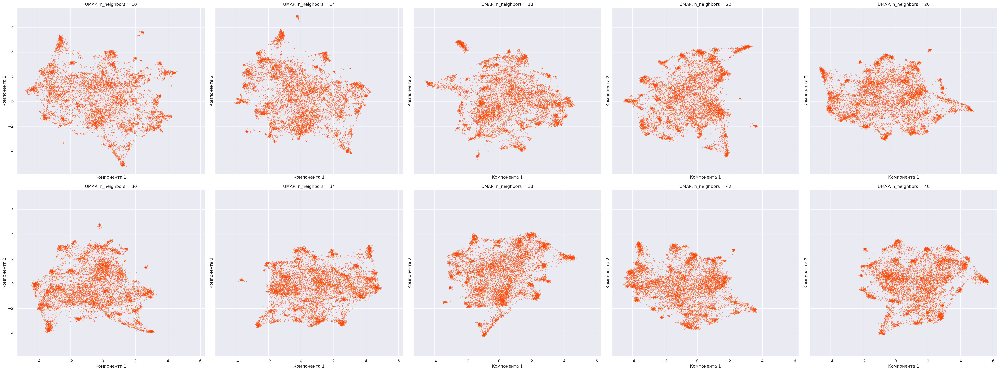

In [26]:
neighbors_list = np.arange(10, 50, 4)
fig, axes = plt.subplots(2, 5, figsize=(40, 15), sharex=True, sharey=True)

axes = axes.flatten()
for ax, neighbors in tqdm(zip(axes, neighbors_list)):
    umap_model = UMAP(
        n_neighbors=neighbors,
        n_components=2,
        min_dist=0.0,
        metric="cosine",
        random_state=100,
    )
    # Применяем UMAP к данным
    umap_result = umap_model.fit_transform(embeddings)
    # Визуализируем результаты
    ax.scatter(umap_result[:, 0], umap_result[:, 1], alpha=0.4, c="orangered", s=2)
    ax.set_title(f"UMAP, n_neighbors = {neighbors}")
    ax.set_xlabel("Компонента 1")
    ax.set_ylabel("Компонента 2")

plt.tight_layout()
plt.show()

#### Разобьем данные на кластеры с помощью HDBSCAN:

In [27]:
from hdbscan import HDBSCAN
# from cuml.cluster.hdbscan import HDBSCAN

#### Покажем результаты кластеризации:

In [28]:
# Уменьшим размерность с помощью UMAP
umap_model = UMAP(
    n_neighbors=15,
    n_components=2,
    min_dist=0.0,
    metric="cosine",
    random_state=100,
)
umap_result = umap_model.fit_transform(embeddings)

10it [00:03,  2.76it/s]


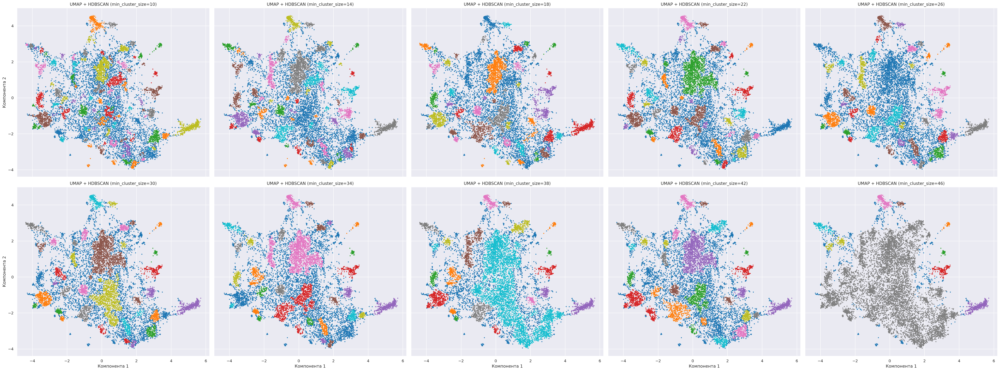

In [29]:
sizes = np.arange(10, 50, 4)
fig, axes = plt.subplots(2, 5, figsize=(40, 15), sharex=True, sharey=True)

axes = axes.flatten()
for ax, size in tqdm(zip(axes, sizes)):
    # Кластеризуем данные с помощью HDBSCAN
    hdbscan_model = HDBSCAN(
        min_cluster_size=size, metric="euclidean", prediction_data=True
    )
    hdbscan_labels = hdbscan_model.fit_predict(umap_result)
    # Создадим DataFrame с результатами UMAP и метками HDBSCAN
    df = pd.DataFrame(umap_result, columns=[f"UMAP{i+1}" for i in range(0, 2, 1)])
    df["Cluster"] = hdbscan_labels
    # Рассеянная диаграмма для результатов UMAP
    sns.scatterplot(
        x="UMAP1",
        y="UMAP2",
        hue="Cluster",
        data=df,
        palette="tab10",
        legend=None,
        linewidth=0,
        s=8,
        ax=ax,
    ).set_title(f"UMAP + HDBSCAN (min_cluster_size={size})")
    ax.set_xlabel("Компонента 1")
    ax.set_ylabel("Компонента 2")

plt.tight_layout()
plt.show()

#### Подставим выбранные гипермараметры для UMAP и HDBSCAN:

Гиперпараметры выбраны с учетом целей:

1. Cохранить локальную структуру данных после уменьшения размерности данных, UMAP
2. Уменьшить количество шума в кластерах, HDBSCAN
3. Создать список понятных тем на выходе

In [30]:
umap_model = UMAP(
    n_neighbors=15,
    n_components=5,
    min_dist=0.0,
    metric="cosine",
    random_state=100,
)
hdbscan_model = HDBSCAN(min_cluster_size=15, metric="euclidean", prediction_data=True)

#### Удалим стоп-слова после распределения текстов по темам:

In [31]:
spacy_stopwords = spacy.lang.en.stop_words.STOP_WORDS

In [32]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer_model = CountVectorizer(
    stop_words=list(spacy_stopwords), min_df=0.03, max_df=0.99, ngram_range=(1, 2)
)

#### Запустим пайплайн и обучим модель:

Модель MaximalMarginalRelevance изменяет порядок слов в темах, чтобы убрать смысловые повторения и составить последовательность из самых значимых слов.

In [33]:
# Создаем модель BERTopic
representation_model = MaximalMarginalRelevance()
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    representation_model=representation_model,
    language="english",
    verbose=True,
    nr_topics="auto",
)

# Обучаем модель
topics, probs = topic_model.fit_transform(clean_data, embeddings)

# Получаем темы
topic_representation = topic_model.get_topic_info()

2024-10-28 05:55:37,114 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


2024-10-28 05:55:37,602 - BERTopic - Dimensionality - Completed ✓
2024-10-28 05:55:37,603 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-10-28 05:55:38,340 - BERTopic - Cluster - Completed ✓
2024-10-28 05:55:38,341 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-10-28 05:55:41,113 - BERTopic - Representation - Completed ✓
2024-10-28 05:55:41,114 - BERTopic - Topic reduction - Reducing number of topics
2024-10-28 05:55:43,462 - BERTopic - Topic reduction - Reduced number of topics from 44 to 37


### Темы:

#### Выведем список тем:

In [34]:
topic_representation["Name"].to_list()

['-1_trump_vote_vote vote_election',
 '0_bezos_amazon_wapo_money',
 '1_polls_voting_early voting_election',
 '2_israel_gaza_palestine_palestinians',
 '3_nazi_rally_nazi rally_hitler',
 '4_republicans_maga_democrats_republican',
 '5_immigrants_immigration_deportation_illegal immigrants',
 '6_tony_comedian_comedy_jokes',
 '7_christian_antichrist_religion_christians',
 '8_women_000_abortion_laws',
 '9_district_boebert_colorado_vote',
 '10_puerto_puerto ricans_ricans_puerto rico',
 '11_musk_elon musk_spacex_tesla',
 '12_harris_vote harris_voted harris_voting harris',
 '13_military_use military_tried_veterans',
 '14_fascist_fascism_fascists_trump fascist',
 '15_citizenship_deport_canada_deported',
 '16_biden_trump_debate_joe biden',
 '17_vote kamala_voting kamala_voting_election',
 '18_putin_russian_russia_russians',
 '19_coach_nba_popovich_spurs',
 '20_democracy_representative democracy_vote_popular vote',
 '21_vance_jd vance_trump_vance president',
 '22_europe_eu_nato_ukraine',
 '23_bunny

#### Покажем темы на графиках:

In [35]:
import plotly.io as pio

pio.renderers.default = "notebook+vscode+jupyterlab"

In [36]:
topic_model.visualize_topics()

In [37]:
hierarchical_topics = topic_model.hierarchical_topics(clean_data)

100%|██████████| 35/35 [00:02<00:00, 15.41it/s]


In [38]:
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

In [39]:
tree = topic_model.get_topic_tree(hierarchical_topics)

In [40]:
print(tree)

.
├─trump_harris_vote_voting_democracy
│    ├─harris_trump_vote_voting_bezos
│    │    ├─harris_trump_vote_voting_election
│    │    │    ├─■──vote kamala_voting kamala_voting_election_kamala harris ── Topic: 17
│    │    │    └─trump_vote_voting_israel_gaza
│    │    │         ├─trump_bezos_vote_voting_election
│    │    │         │    ├─bezos_amazon_wapo_money_republicans
│    │    │         │    │    ├─■──republicans_maga_democrats_republican_gop ── Topic: 4
│    │    │         │    │    └─■──bezos_amazon_wapo_money_media ── Topic: 0
│    │    │         │    └─voting_vote_election_polls_voters
│    │    │         │         ├─voting_polls_election_early voting_voters
│    │    │         │         │    ├─■──harris_vote harris_voted harris_voting harris_harris wins ── Topic: 12
│    │    │         │         │    └─■──polls_voting_early voting_election_voters ── Topic: 1
│    │    │         │         └─■──israel_gaza_palestine_palestinians_voting ── Topic: 2
│    │    │         └─■──dis

## Сохраним результат моделирования за день в формате csv:

#### Создадим датафрейм с данными:

In [41]:
topics_bert = topic_representation["Name"].to_list()

# Получим текущую дату и время
now = datetime.now()
# Преобразуем их в строку в формате YYYYMMDD
date_str = now.strftime("%Y_%m_%d")

df_bert = pd.DataFrame(
    data=topic_model.generate_topic_labels(nr_words=None, topic_prefix=False),
    columns=["topics"],
)
df_bert["date"] = date_str
df_bert["size"] = df_bert.index
df_bert = df_bert[["date", "size", "topics"]]

In [42]:
def clean_df_bert(df):
    df = re.sub(r"_", ",", df)
    return df

In [43]:
df_bert["topics"] = df_bert["topics"].apply(clean_df_bert)
print(df_bert)

          date  size                                             topics
0   2024_10_28     0  trump,vote,vote vote,election,harris,voting,pr...
1   2024_10_28     1  bezos,amazon,wapo,money,media,billionaires,new...
2   2024_10_28     2  polls,voting,early voting,election,voters,vote...
3   2024_10_28     3  israel,gaza,palestine,palestinians,voting,neta...
4   2024_10_28     4  nazi,rally,nazi rally,hitler,nazis,madison squ...
5   2024_10_28     5  republicans,maga,democrats,republican,gop,repu...
6   2024_10_28     6  immigrants,immigration,deportation,illegal imm...
7   2024_10_28     7  tony,comedian,comedy,jokes,funny,humor,comedia...
8   2024_10_28     8  christian,antichrist,religion,christians,jesus...
9   2024_10_28     9  women,000,abortion,laws,states,500,abortions,p...
10  2024_10_28    10  district,boebert,colorado,vote,voting,voted,re...
11  2024_10_28    11  puerto,puerto ricans,ricans,puerto rico,puerto...
12  2024_10_28    12  musk,elon musk,spacex,tesla,trump,illegal,

In [44]:
def save_dataframe(df):
    # Получим текущую дату и время
    now = datetime.now()

    # Преобразуем их в строку в формате YYYYMMDD
    date_str = now.strftime("%Y_%m_%d")

    # Сохраним DataFrame в CSV-файл с текущей датой в имени файла
    df.to_csv(
        f"top_csvs/{subreddit.display_name}_topics_{date_str}.csv",
        index=False,
    )

In [45]:
save_dataframe(df_bert)

### Сохраним исходные данные в формате csv:

In [46]:
import csv

In [47]:
data_list = []
for doc in clean_data:
    doc = [doc]
    data_list.append(doc)

In [48]:
fields = date_str
rows = data_list

with open(
    f"top_csvs/original_data/{subreddit.display_name}_data_{date_str}.csv", "w"
) as f:
    write = csv.writer(f)
    write.writerow(fields)
    write.writerows(rows)

## Выводы

Был построен алгоритм, который собирает данные из открытого источника информации - раздела Politics из форума Reddit, затем извлекает самые обсуждаемые темы с помощью модели BERTopic. С небольшими доработками, можно превратить этот ноутбук в скрипт, который будет запускаться по расписанию и собирать данные. Когда накопиться требуемый обьем данных - можно проводить новые исследования. Например, динамическое тематическое моделирование с целью исследования изменения трендов в обсуждениях со временем.

В работе не представлены метрики для оценки качества модели, т.к. отсутсвие надежных метрик - одна из актуальных проблем в области тематического моделирования. Наилучший результат, который подвержен субьективности, достигается с помощью перебора разных параметров модели. По этой причине, BERTopic выгодно отличается от других решений, т.к. с каждым алгоритмом в модели можно экспериментировать отдельно и не проводить каждый раз полное моделирование. В целом, этот проект направлен на дальнейшую автоматизацию и требует тематическую модель, которая будет показывать понятные темы с минимальной настройкой гиперпараметров, т.к. скрипт для извлечения тем будет запускаться автоматически. BERTopic - единственная на данный момент модель, которая позволяет сделать это.